# Preparação do Ambiente

In [10]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
import matplotlib.pyplot as plt
import gymnasium as gym
from IPython.display import HTML, display
from matplotlib import animation

In [11]:
torch.manual_seed(42)
np.random.seed(42)

In [12]:
def moving_average(rewards, window_size=10):
    n = len(rewards)
    grouped_means = [np.mean(rewards[i:i+window_size]) for i in range(0, n, window_size)]
    grouped_indices = [i for i in range(0, n, window_size)]
    return grouped_indices, grouped_means

In [13]:
def plot_rewards(train_rewards, test_rewards=None, title=None, max_reward=None, window_size=10):
    if test_rewards is not None:
        fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    else:
        fig, axes = plt.subplots(1, 1, figsize=(10, 5))
        axes = [axes]

    # TRAINING
    axes[0].plot(train_rewards, label='Reward (puro)', color='skyblue', alpha=0.6)
    train_x, train_avg = moving_average(train_rewards, window_size)
    axes[0].plot(train_x, train_avg, label=f'Média a cada {window_size}', color='orange')
    axes[0].set_title("Training")
    axes[0].set_xlabel("Episodes")
    axes[0].set_ylabel("Reward")

    if max_reward is not None:
        axes[0].axhline(max_reward, color='red', linestyle='--', label='Max Reward')

    axes[0].legend()

    # TESTING
    if test_rewards is not None:
        axes[1].plot(test_rewards, label='Reward (puro)', color='skyblue', alpha=0.6)
        test_x, test_avg = moving_average(test_rewards, window_size)
        axes[1].plot(test_x, test_avg, label=f'Média a cada {window_size}', color='orange')
        axes[1].set_title("Testing")
        axes[1].set_xlabel("Episodes")
        axes[1].set_ylabel("Reward")

        if max_reward is not None:
            axes[1].axhline(max_reward, color='red', linestyle='--', label='Max Reward')

        axes[1].legend()

    if title:
        fig.suptitle(title)

    plt.tight_layout()
    plt.show()

# Replay Buffer

In [14]:
class ReplayBuffer:
   def __init__(self, capacity, observation_shape):
      self._index = 0
      self._size = 0
      self._capacity = capacity
      self._memory = {
         "states": np.zeros((capacity, *observation_shape), dtype=np.float32),
         "actions": np.zeros((capacity,), dtype=np.int32),
         "rewards": np.zeros((capacity,), dtype=np.float32),
         "next_states": np.zeros((capacity, *observation_shape), dtype=np.float32),
         "dones": np.zeros((capacity,), dtype=np.int32)
      }
   
   def add(self, state, action, reward, next_state, done):
      self._memory["states"][self._index] = state
      self._memory["actions"][self._index] = action
      self._memory["rewards"][self._index] = reward
      self._memory["next_states"][self._index] = next_state
      self._memory["dones"][self._index] = done
      self._index = (self._index + 1) % self._capacity
      self._size = min(self._size + 1, self._capacity)
   
   def sample(self, batch_size):
      indexes = np.random.choice(self._size, batch_size, replace=False)
      return (
         self._memory["states"][indexes],
         self._memory["actions"][indexes],
         self._memory["rewards"][indexes],
         self._memory["next_states"][indexes],
         self._memory["dones"][indexes]
      )
      
   def __len__(self):
      return self._size

# Definição da Rede

In [15]:
class DQN(nn.Module):
   def __init__(self, observation_shape, action_shape):
      super(DQN, self).__init__()
      self.fc1 = nn.Linear(observation_shape[0], 128)
      self.fc2 = nn.Linear(128, 128)
      self.fc3 = nn.Linear(128, action_shape)
   
   def forward(self, x):
      x = torch.relu(self.fc1(x))
      x = torch.relu(self.fc2(x))
      x = self.fc3(x)
      return x

# Definição do Agente

In [16]:
class DDQNAgent:
   def __init__(self, env,
                target_update=100,
                epsilon=1,
                alpha=1e-3,
                gamma=0.999,
                epsilon_decay=0.998,
                epsilon_min=0.01,
                batch_size=64,
                replay_buffer_size=100000,
                tau=0.005):
      self.epsilon = epsilon
      self.alpha = alpha
      self.gamma = gamma
      self.epsilon_decay = epsilon_decay
      self.epsilon_min = epsilon_min
      self.batch_size = batch_size
      self.tau = tau
      self.target_update = target_update
      
      self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
      self.env = env
      
      self.dqn = DQN(env.observation_space.shape, env.action_space.n).to(self.device)
      self.dqn_target = DQN(env.observation_space.shape, env.action_space.n).to(self.device)

      self.dqn_target.load_state_dict(self.dqn.state_dict())
      self.dqn_target.eval()
      
      self.replay = ReplayBuffer(replay_buffer_size, env.observation_space.shape)
      
      self.optimizer = optim.Adam(self.dqn.parameters(), lr=alpha)
      self.loss = nn.SmoothL1Loss()
   
   def _update_dqn_target(self):
      self.dqn_target.load_state_dict(self.dqn.state_dict())

   def act(self, state):
      self.dqn.eval()
      
      if np.random.rand() < self.epsilon:
         return self.env.action_space.sample()
      
      with torch.no_grad():
         state = torch.tensor(state, dtype=torch.float32).to(self.device)
         action = self.dqn(state).argmax(dim=-1).item()
      
      return action
   
   def update(self):
      self.dqn.train()
      
      states, actions, rewards, next_states, dones = self.replay.sample(self.batch_size)
      
      states = torch.as_tensor(states).to(self.device)
      actions = torch.as_tensor(actions).to(self.device).unsqueeze(-1)
      rewards = torch.as_tensor(rewards).to(self.device).unsqueeze(-1)
      next_states = torch.as_tensor(next_states).to(self.device)
      dones = torch.as_tensor(dones).to(self.device).unsqueeze(-1)
      
      q_eval = self.dqn(states).gather(-1, actions.long())
      
      with torch.no_grad():
         next_actions = self.dqn(next_states).argmax(dim=1, keepdim=True)
         q_next = self.dqn_target(next_states).gather(1, next_actions)
         q_target = rewards + self.gamma * q_next * (1 - dones)
      
      loss = self.loss(q_eval, q_target)
      self.optimizer.zero_grad()
      loss.backward()
      self.optimizer.step()
         
   def train(self, episodes, verbose=False):
      progress = tqdm(range(1, episodes + 1), desc="Training", disable=not verbose)
      rewards = []
      updated_count = 0
            
      for episode in progress:
         state, _ = self.env.reset()
         episode_reward = 0
         done = False
         
         while not done:
            action = self.act(state)
            next_state, reward, terminated, truncated, _ = self.env.step(action)
            done = terminated or truncated
            self.replay.add(state, action, reward, next_state, done)
            state = next_state
            episode_reward += reward
            
            if len(self.replay) > self.batch_size:
               self.update()
               updated_count +=1
         
               if updated_count % self.target_update == 0:
                  self._update_dqn_target()
         
         self.epsilon = max(self.epsilon * self.epsilon_decay, self.epsilon_min)
         
         rewards.append(episode_reward)
         progress.set_postfix({ "Reward": episode_reward, "Epsilon": self.epsilon })
         
      return rewards
   
   def evaluate(self, episodes, verbose=False):
      progress = tqdm(range(1, episodes + 1), desc="Evaluating", disable=not verbose)
      rewards = []
      
      epsilon_real = self.epsilon
      self.epsilon = 0
      
      self.dqn.eval()
      
      for episode in progress:
         state, _ = self.env.reset()
         episode_reward = 0
         done = False
         
         while not done:
            action = self.act(state)
            next_state, reward, terminated, truncated, _ = self.env.step(action)
            done = terminated or truncated
            state = next_state
            episode_reward += reward
            
         rewards.append(episode_reward)
         progress.set_postfix({ "Reward": episode_reward })
      
      self.epsilon = epsilon_real
         
      return rewards

   def save(self, path):
      torch.save(self.dqn.state_dict(), path)
   
   def load(self, path):
      self.dqn.load_state_dict(torch.load(path))
   
   def render(self, env, max_steps: int = 500, interval: int = 30, figsize: tuple = (6, 6)):
      """
      Executa o agente no ambiente por até max_steps, captura frames e exibe
      uma animação inline no notebook.
      """
      frames = []
      state, _ = env.reset()
      done = False

      for _ in range(max_steps):
         # captura frame como array RGB
         frame = env.render()
         frames.append(frame)

         # ação greedy (sem exploração)
         action = self.act(state)
         state, reward, terminated, truncated, _ = env.step(action)
         done = terminated or truncated
         if done:
               break

      # fecha o ambiente
      env.close()

      # monta figure/axis
      fig = plt.figure(figsize=figsize)
      plt.axis("off")
      im = plt.imshow(frames[0])

      # função de atualização para cada frame
      def animate(i):
         im.set_array(frames[i])
         return [im]

      # cria a animação
      anim = animation.FuncAnimation(
         fig, animate, frames=len(frames), interval=interval
      )
      display(HTML(anim.to_jshtml()))

# Ambientes

In [17]:
envs = [
    ("CartPole-v1",       "CartPole",       "cartpole_ddqn.pt",      500),
    ("Acrobot-v1",        "Acrobot",        "acrobot_ddqn.pt",       0),
    ("MountainCar-v0",    "MountainCar",    "mountaincar_ddqn.pt",   -50),
    ("LunarLander-v3",    "LunarLander",    "lunarlander_ddqn.pt",   200),
]

Training CartPole...


Evaluating: 100%|██████████| 100/100 [00:06<00:00, 16.20it/s, Reward=500]


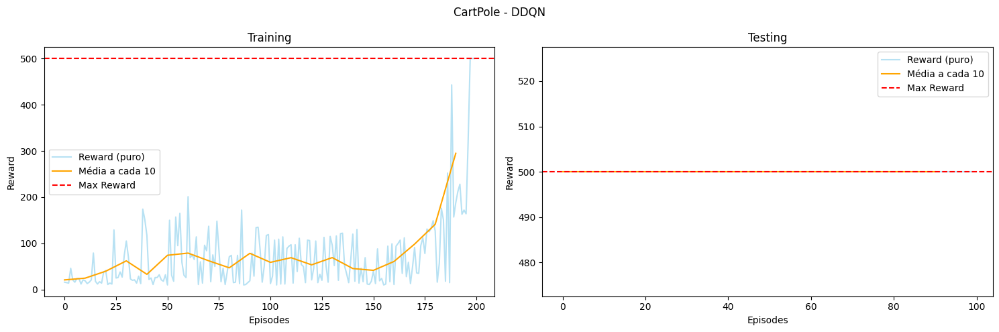

Done!

Training Acrobot...


Evaluating: 100%|██████████| 100/100 [00:03<00:00, 27.49it/s, Reward=-80]


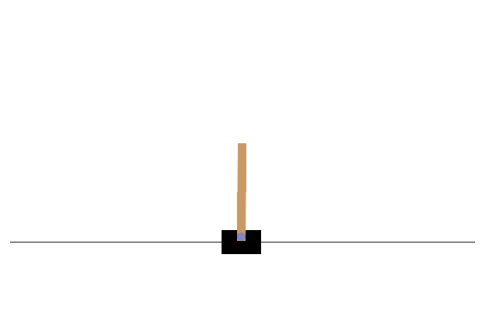

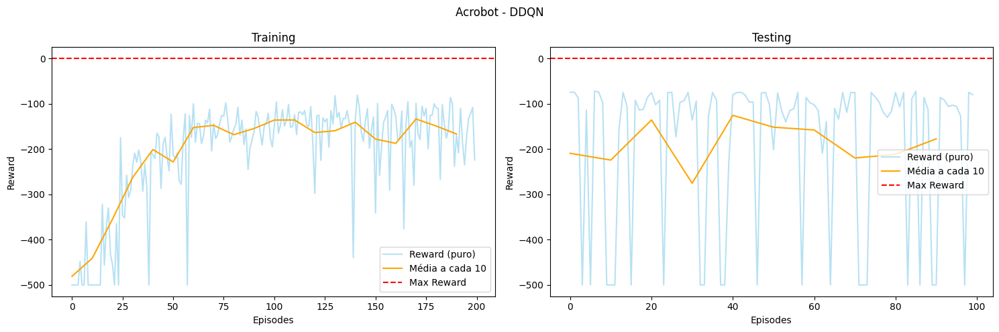

Done!

Training MountainCar...


Evaluating: 100%|██████████| 100/100 [00:02<00:00, 39.53it/s, Reward=-200]


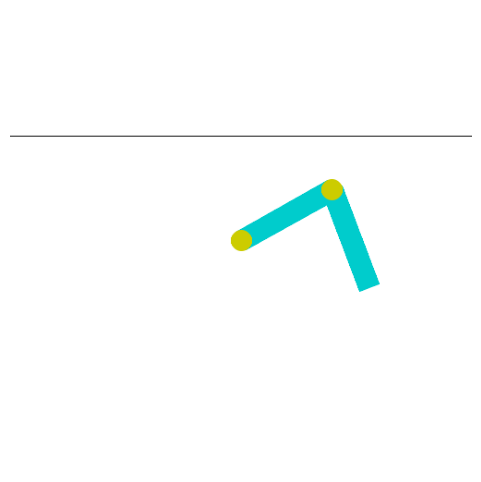

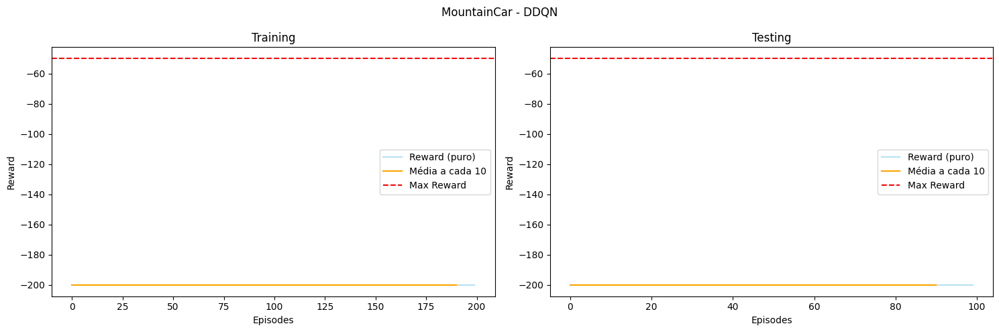

Done!

Training LunarLander...


Evaluating: 100%|██████████| 100/100 [00:02<00:00, 47.03it/s, Reward=-1.29e+3]


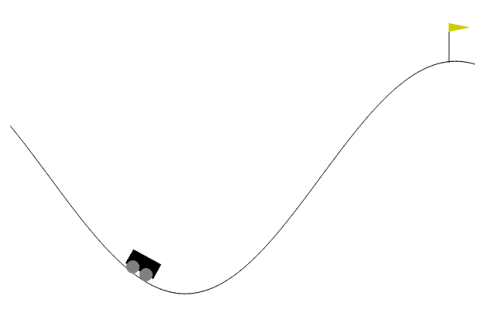

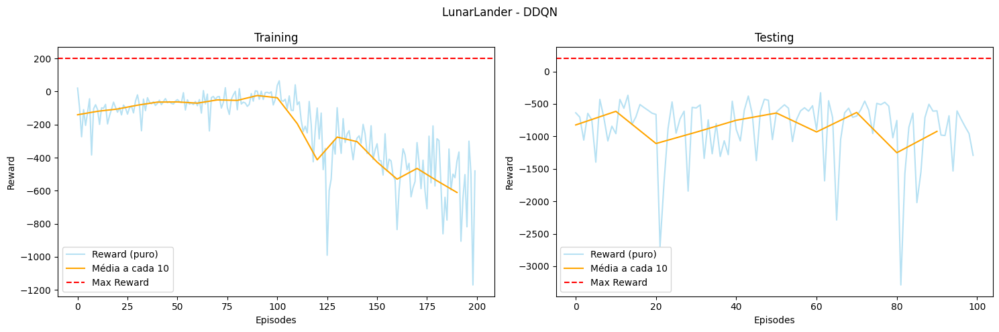

Done!



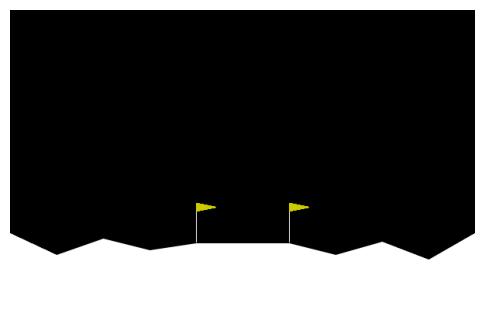

In [18]:

for env_name, env_title, path, max_reward in envs:
   print(f"Training {env_title}...")
   
   env = gym.make(env_name)
   agent = DDQNAgent(env, epsilon_decay=0.99)
   
   train_rewards = agent.train(200, verbose=True)
   test_rewards = agent.evaluate(100, verbose=True)
   
   agent.save(f'checkpoint/{path}')
   
   plot_rewards(train_rewards, test_rewards, f"{env_title} - DDQN", max_reward=max_reward)
   
   env = gym.make(env_name, render_mode="rgb_array")
   agent.render(env, max_steps=500, interval=30, figsize=(6, 6))
      
   print("Done!\n")